## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

[//]: # (Image References)

[image1]: ./examples/undistort_output.png "Undistorted"
[image2]: ./test_images/test1.jpg "Road Transformed"
[image3]: ./examples/binary_combo_example.jpg "Binary Example"
[image4]: ./examples/warped_straight_lines.jpg "Warp Example"
[image5]: ./examples/color_fit_lines.jpg "Fit Visual"
[image6]: ./examples/example_output.jpg "Output"
[video1]: ./project_video.mp4 "Video"


---

## Camera Calibration
### 1. Briefly state how you computed the camera matrix and distortion coefficients. Provide an example of a distortion corrected calibration image.

__Import libraries__

In [1]:
# The following code was copied from the "./examples/example.ipynb"
# I started from there

import numpy as np
import cv2
import glob
import matplotlib
import os

# Received TypeError: 'figure' is an unknown keyword argument
# Use the solution from here 
# https://stackoverflow.com/questions/37916424/backend-qt5-py-figure-is-an-unknown-keyword-argument-in-matplotlib/41018761#41018761
# Refer to 
# https://github.com/matplotlib/matplotlib/issues/5650/
#matplotlib.get_backend()
#matplotlib.use('Qt5Agg')

from matplotlib import pyplot as plt

# Remember not to use the following line
# %matplotlib qt
%matplotlib inline

__Set chessboard size__

The calibration images in the lesson exercise were taken with a different camera setting and a different chessboard pattern than the calibration images for the project. You need to set your chessboard size to 9x6 for the project instead of 8x6 as in the lesson.

In [2]:
# Set the inside corners in x,y
nx = 9
ny = 6

__Define functions__

In [3]:
# Define functions
# Write a function that takes an image, object points, and image points
# performs the camera calibration, image distortion correction and 
# returns the undistorted image
def cal_undistort(img, img_gray, objpoints, imgpoints):
    # # Use cv2.calibrateCamera() and cv2.undistort()

    # Camera calibration
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_gray.shape[::-1], None, None)
    # Undistort image
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist, mtx

# MODIFY THIS FUNCTION TO GENERATE OUTPUT 
# THAT LOOKS LIKE THE IMAGE ABOVE
def corners_unwarp(img, img_gray, nx, ny, mtx, corners):
        # Offset
        offset = 100
        img_size = (img_gray.shape[1], img_gray.shape[0])
        # Four source coordinates
        src = np.float32([corners[0],corners[nx-1],corners[-1],corners[-nx]])
        # Define 4 destination points dst = np.float32([[,],[,],[,],[,]])
        dst = np.float32([[offset,offset],[img_size[0]-offset,100],[img_size[0]-offset,img_size[1]-offset],[offset,img_size[1]-offset]])
        # Use cv2.getPerspectiveTransform() to get M, the transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # Use cv2.warpPerspective() to warp your image to a top-down view
        warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
        return warped, M

__Initialization__

In [4]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny * nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.
img_list_orignial = [] # Original image list
img_list_corners = [] # Corners drew image list
img_list_undistorted = [] # Undistorted image list
img_list_warped = [] # Warped image list
img_list_success_name = [] # Success to detect corners image name list
img_list_fail_name = [] # Failed to detect corners image name list
img_list_fail = [] # Failed to detect corners image list

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

__Process each images__

In [5]:
# Step through the list and search for chessboard corners

# If I am using img directly in the following steps, it will change the image stored in img_list_orignial
# Don't know why
# I am separating the image into two loops
for fname in images:
    # Read in an image
    raw = cv2.imread(fname)
    # Append the original image to the list
    img_list_orignial.append(raw)

for fname in images:
    # Read in an image
    img = cv2.imread(fname)

    # Convert an image from BGR to Grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)
    # If found, add object points, image points
    if True == ret:
        # Append the object point to the list
        objpoints.append(objp)
        # Append the detected inside corners to the list
        imgpoints.append(corners)

        # Draw the corners
        corners_img = cv2.drawChessboardCorners(img, (ny,nx), corners, ret)
        # Append the corners drew image to the list
        img_list_corners.append(corners_img)
        
        # Camera calibration and undistort image
        undist, mtx = cal_undistort(corners_img, gray, objpoints, imgpoints)
        # Append the undistorted image to the list
        img_list_undistorted.append(undist)

        # Warped image
        warped, M = corners_unwarp(undist, gray, nx, ny, mtx, corners)
        # Append the warped image to the list
        img_list_warped.append(warped)
        
        # Add success image name
        img_list_success_name.append(fname.split("\\")[-1])
    
    # If it fail to detect the corners in the image, append the original image to the list
    # Append the fail image to img_list_fail
    else:
        img_list_corners.append(img)
        img_list_undistorted.append(img)
        img_list_warped.append(img)
        img_list_fail_name.append(fname)
        img_list_fail.append(img)

__Plot images__

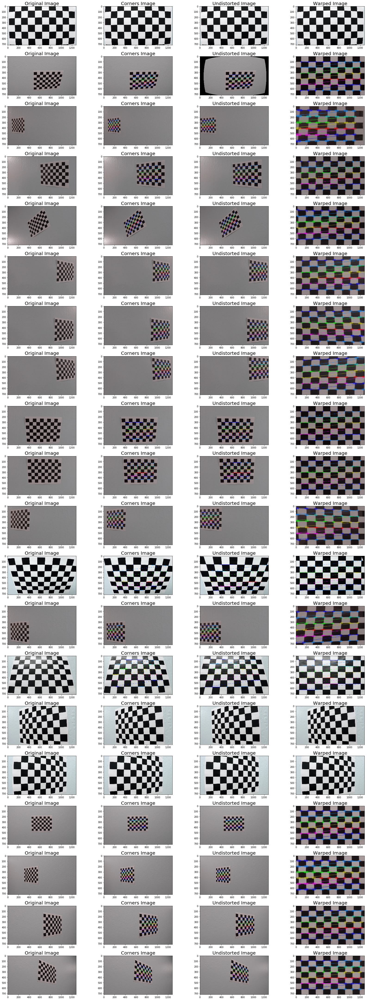

In [6]:
table_1_row = len(img_list_orignial)

fig, subplot = plt.subplots(table_1_row, 4, figsize=(24, 60))
#subplot = subplot.ravel()

idx_row = 0
for idx_row in range(subplot.shape[0]):
    subplot[idx_row][0].imshow(img_list_orignial[idx_row])
    subplot[idx_row][0].set_title('Original Image', fontsize=20)
    subplot[idx_row][1].imshow(img_list_corners[idx_row])
    subplot[idx_row][1].set_title('Corners Image', fontsize=20)
    subplot[idx_row][2].imshow(img_list_undistorted[idx_row])
    subplot[idx_row][2].set_title('Undistorted Image', fontsize=20)
    subplot[idx_row][3].imshow(img_list_warped[idx_row])
    subplot[idx_row][3].set_title('Warped Image', fontsize=20)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
fig.tight_layout()

__Save images__

In [7]:
# Save images to file
for idx in range(len(img_list_success_name)):
    # Output images
    cv2.imwrite("output_images/output_"+img_list_success_name[idx],img_list_warped[idx])

__Observation__

There are some images not detecting any corners.
Plotting here for future investigation.

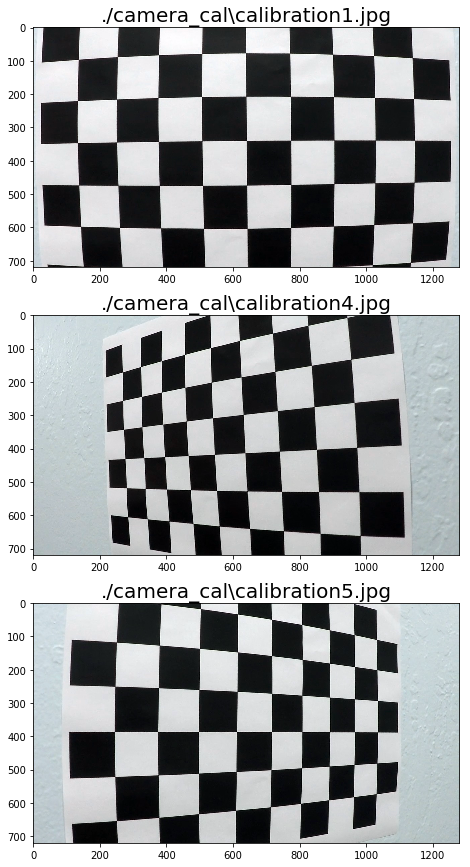

In [8]:
table_2_row = len(img_list_fail)

fig, subplot = plt.subplots(table_2_row, 1, figsize=(12, 15))

idx_row = 0
for idx_row in range(table_2_row):
    subplot[idx_row].imshow(img_list_fail[idx_row])
    subplot[idx_row].set_title(img_list_fail_name[idx_row], fontsize=20)


## Pipeline (test images)
### 1. Provide an example of a distortion-corrected image.

To demonstrate this step, I will describe how I apply the distortion correction to one of the test images like this one:
![alt text](./test_images/test2.jpg)


### 2.Describe how (and identify where in your code) you used color transforms, gradients or other methods to create a thresholded binary image. Provide an example of a binary image result.

I will apply gradient threshold and color threshold to the above image. Then I will combine both threshold together.

#### __Gradient Threshold__

__Import libraries__

In [9]:
# # All the following libraries were imported above
# # Uncommented the following lines if you just want to run this section

# import numpy as np
# import cv2
# import matplotlib.pyplot as plt
# import matplotlib.image as mpimg

# %matplotlib inline

__Define functions__

In [10]:
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.

def convert_BGR2GRAY(img):
    retimg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return retimg

def convert_BGR2RGB(img):
    retimg = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return retimg

def abs_sobel_threshold(img, orient='x', grad_thresh=(0, 255)):
    # 1) Convert to grayscale
    gray = convert_BGR2GRAY(img)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if 'x' == orient:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    elif 'y' == orient:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    else:
        sobel = 0
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel > grad_thresh[0]) & (scaled_sobel < grad_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    binary_output = sxbinary
    return binary_output

# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_threshold(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = convert_BGR2GRAY(img)
    # 2) Take the gradient in x and y separately
    # Gradient in x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    # Gradient in y
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Calculate the magnitude
    abs_sobelxy = np.sqrt(sobelx**2+sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(abs_sobelxy)/255
    scaled_sobelxy = np.uint8(abs_sobelxy/scale_factor)
    # 5) Create a binary mask where mag thresholds are met
    #sxybinary = np.zeros_like(scaled_sobelxy)
    sxybinary = np.zeros_like(scaled_sobelxy)
    sxybinary[(scaled_sobelxy > mag_thresh[0])&(scaled_sobelxy < mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
#     binary_output = np.copy(img) # Remove this line
    binary_output = sxybinary
    return binary_output

# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, dir_thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = convert_BGR2GRAY(img)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    graddir = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(graddir)
    binary_output[(graddir > dir_thresh[0])&(graddir < dir_thresh[1])]=1
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    return binary_output

__Initialization__

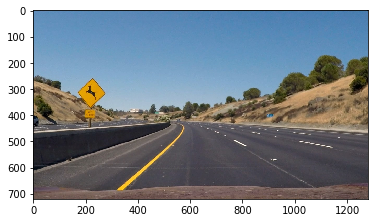

In [11]:
# Choose a Sobel kernel size
ksize = 15 # Choose a larger odd number to smooth gradient measurements

# Define thresholds
grad_thresh=(20, 100)
mag_thresh=(30, 100)
dir_thresh=(0.7, 1.3)

# Path to image
fname = './test_images/test2.jpg'
# Read in an image
img = cv2.imread(fname)
# Plot the original image
plt.imshow(convert_BGR2RGB(img))

__Process each images__

In [12]:
# Run the function
original = convert_BGR2RGB(img)
gradx_binary = abs_sobel_threshold(img, orient='x', grad_thresh=(20, 100))
grady_binary = abs_sobel_threshold(img, orient='y', grad_thresh=(20, 100))
mag_binary = mag_threshold(img, sobel_kernel=ksize, mag_thresh=(30, 100))
dir_binary = dir_threshold(img, sobel_kernel=ksize, dir_thresh=(0.7, 1.3))

__Plot images__

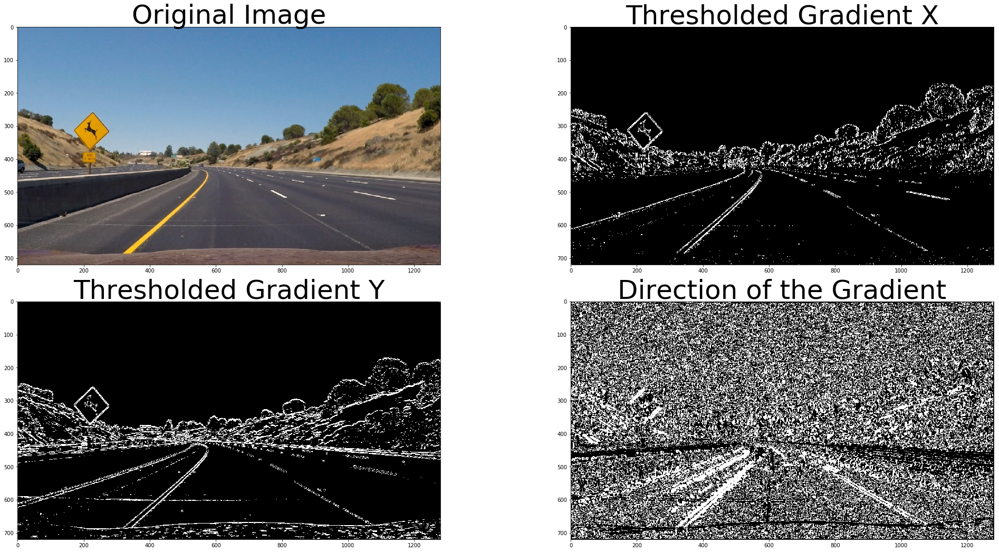

In [13]:
# Plot the result
f, axs = plt.subplots(2, 2, figsize=(30, 15))
axs = axs.ravel()
axs[0].imshow(original)
axs[0].set_title('Original Image', fontsize=50)
axs[1].imshow(gradx_binary, cmap='gray')
axs[1].set_title('Thresholded Gradient X', fontsize=50)
axs[2].imshow(grady_binary, cmap='gray')
axs[2].set_title('Thresholded Gradient Y', fontsize=50)
axs[3].imshow(dir_binary, cmap='gray')
axs[3].set_title('Direction of the Gradient', fontsize=50)

f.tight_layout()
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

__Save images__

In [14]:
# Output images
cv2.imwrite("output_images/output_"+"Original Image.jpg",original)
cv2.imwrite("output_images/output_"+"Thresholded Gradient X.jpg",gradx_binary)
cv2.imwrite("output_images/output_"+"Thresholded Gradient Y.jpg",grady_binary)
cv2.imwrite("output_images/output_"+"Direction of the Gradient.jpg",dir_binary)

True

#### __Color Threshold__

__Import libraries__

In [15]:
# # All the following libraries were imported above
# # Uncommented the following lines if you just want to run this section

# import numpy as np
# import cv2
# import matplotlib.pyplot as plt
# import matplotlib.image as mpimg

# %matplotlib inline

__Define functions__

In [16]:
def gray_threshold(img, thresh=(20, 100)):
    # Using cv2.imread so need to use cv2.COLOR_BGR2GRAY
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray_binary = np.zeros_like(gray_img)
    gray_binary[(gray_img > thresh[0]) & (gray_img <= thresh[1])] = 1
    return gray_img, gray_binary

def hls_threshold(img, color='h', color_thresh=(20, 100)):
    # Using cv2.imread so need to use cv2.COLOR_BGR2HLS
    hls_img = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    if color == 'h':
        color_img = hls_img[:,:,0]
    elif color == 'l':
        color_img = hls_img[:,:,1]
    elif color == 's':
        color_img = hls_img[:,:,2]
    else:
        color_img = hls_img[:,:,:]
    color_binary = np.zeros_like(color_img)
    color_binary[(color_img > color_thresh[0]) & (color_img <= color_thresh[1])] = 1
    return color_img, color_binary

def rgb_threshold(img, color='r', color_thresh=(20, 100)):
        # Using cv2.imread so need to use cv2.COLOR_BGR2RGB
    rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if color == 'r':
        color_img = rgb_img[:,:,0]
    elif color == 'g':
        color_img = rgb_img[:,:,1]
    elif color == 'b':
        color_img = rgb_img[:,:,2]
    else:
        color_img = rgb_img[:,:,:]
    color_binary = np.zeros_like(color_img)
    color_binary[(color_img > color_thresh[0]) & (color_img <= color_thresh[1])] = 1
    return color_img, color_binary

__Initialization__

In [17]:
# # Path to image
# fname = './test_images/test2.jpg'
# # Read in an image
# img = cv2.imread(fname)
# # Plot the original image
# plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

__Process each images__

In [18]:
# Run the function
gray_img, gray_binary = gray_threshold(img, thresh=(180, 255))
h_img, h_binary = hls_threshold(img, color='h', color_thresh=(15, 100))
l_img, l_binary = hls_threshold(img, color='l', color_thresh=(30, 100))
s_img, s_binary = hls_threshold(img, color='s', color_thresh=(90, 255))
r_img, r_binary = rgb_threshold(img, color='r', color_thresh=(200, 255))
g_img, g_binary = rgb_threshold(img, color='g', color_thresh=(30, 100))
b_img, b_binary = rgb_threshold(img, color='b', color_thresh=(15, 100))

__Plot images__

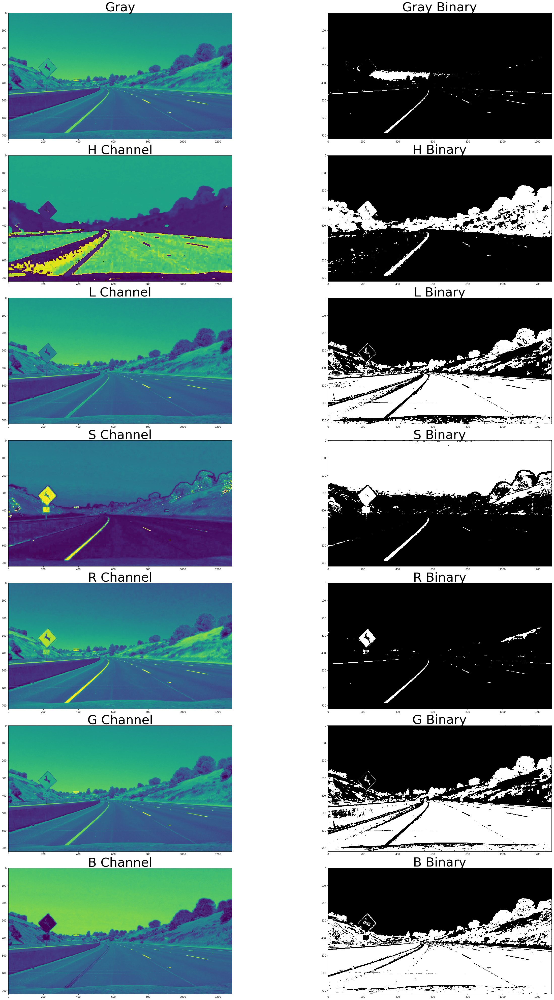

In [19]:
# Plot the result
f, axs = plt.subplots(7, 2, figsize=(120, 60))
axs = axs.ravel()

axs[0].imshow(gray_img)
axs[0].set_title('Gray', fontsize=50)
axs[1].imshow(gray_binary, cmap='gray')
axs[1].set_title('Gray Binary', fontsize=50)
axs[2].imshow(h_img)
axs[2].set_title('H Channel', fontsize=50)
axs[3].imshow(h_binary, cmap='gray')
axs[3].set_title('H Binary', fontsize=50)
axs[4].imshow(l_img)
axs[4].set_title('L Channel', fontsize=50)
axs[5].imshow(l_binary, cmap='gray')
axs[5].set_title('L Binary', fontsize=50)
axs[6].imshow(s_img)
axs[6].set_title('S Channel', fontsize=50)
axs[7].imshow(s_binary, cmap='gray')
axs[7].set_title('S Binary', fontsize=50)
axs[8].imshow(r_img)
axs[8].set_title('R Channel', fontsize=50)
axs[9].imshow(r_binary, cmap='gray')
axs[9].set_title('R Binary', fontsize=50)
axs[10].imshow(g_img)
axs[10].set_title('G Channel', fontsize=50)
axs[11].imshow(g_binary, cmap='gray')
axs[11].set_title('G Binary', fontsize=50)
axs[12].imshow(b_img)
axs[12].set_title('B Channel', fontsize=50)
axs[13].imshow(b_binary, cmap='gray')
axs[13].set_title('B Binary', fontsize=50)

f.tight_layout()
plt.subplots_adjust(left=0., right=0.4, top=0.9, bottom=0.)

__Save images__

In [20]:
# Output images
cv2.imwrite("output_images/output_"+"Gray.jpg",gray_img)
cv2.imwrite("output_images/output_"+"gray_binary.jpg",gray_binary)
cv2.imwrite("output_images/output_"+"H Channel.jpg",h_img)
cv2.imwrite("output_images/output_"+"H Binary.jpg",h_binary)
cv2.imwrite("output_images/output_"+"L Channel.jpg",l_img)
cv2.imwrite("output_images/output_"+"L Binary.jpg",l_binary)
cv2.imwrite("output_images/output_"+"S Channel.jpg",s_img)
cv2.imwrite("output_images/output_"+"S Binary.jpg",s_binary)
cv2.imwrite("output_images/output_"+"R Channel.jpg",r_img)
cv2.imwrite("output_images/output_"+"R Binary.jpg",r_binary)
cv2.imwrite("output_images/output_"+"G Channel.jpg",g_img)
cv2.imwrite("output_images/output_"+"G Binary.jpg",g_binary)
cv2.imwrite("output_images/output_"+"B Channel.jpg",b_img)
cv2.imwrite("output_images/output_"+"B Binary.jpg",b_binary)

True

#### __Combining thresholds__

In the following section, I am going to combine the color and gradient. For gradient, Threshold Gradient X would be a good choice. For color, H Binary, S Binary or R Binary are doing very nice job.

After all, I will pick a combination of Threshold Gradient X and S binary.

__Import libraries__

In [21]:
# # All the following libraries were imported above
# # Uncommented the following lines if you just want to run this section

# import numpy as np
# import cv2
# import matplotlib.pyplot as plt
# import matplotlib.image as mpimg

# %matplotlib inline

__Define functions__

In [22]:
# def abs_sobel_threshold(img, orient='x', grad_thresh=(0, 255)):
#     # 1) Convert to grayscale
#     gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#     # 2) Take the derivative in x or y given orient = 'x' or 'y'
#     if 'x' == orient:
#         sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
#     elif 'y' == orient:
#         sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
#     else:
#         sobel = 0
#     # 3) Take the absolute value of the derivative or gradient
#     abs_sobel = np.absolute(sobel)
#     # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
#     scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
#     # 5) Create a mask of 1's where the scaled gradient magnitude 
#             # is > thresh_min and < thresh_max
#     sxbinary = np.zeros_like(scaled_sobel)
#     sxbinary[(scaled_sobel > grad_thresh[0]) & (scaled_sobel < grad_thresh[1])] = 1
#     # 6) Return this mask as your binary_output image
#     #binary_output = np.copy(img) # Remove this line
#     binary_output = sxbinary
#     return binary_output

# def hls_threshold(img, color='h', color_thresh=(20, 100)):
#     # Using cv2.imread so need to use cv2.COLOR_BGR2HLS
#     hls_img = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
#     if color == 'h':
#         color_img = hls_img[:,:,0]
#     elif color == 'l':
#         color_img = hls_img[:,:,1]
#     elif color == 's':
#         color_img = hls_img[:,:,2]
#     else:
#         color_img = hls_img[:,:,:]
#     color_binary = np.zeros_like(color_img)
#     color_binary[(color_img > color_thresh[0]) & (color_img <= color_thresh[1])] = 1
#     return color_img, color_binary

__Initialization__

In [23]:
# # Path to image
# fname = './test_images/test2.jpg'
# # Read in an image
# img = cv2.imread(fname)
# # Plot the original image
# plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

__Process image__

In [24]:
# Run functions
gradx_binary = abs_sobel_threshold(img, orient='x', grad_thresh=(20, 100))
s_img, s_binary = hls_threshold(img, color='s', color_thresh=(90, 255))

# Stack each channel to view their individual contributions in green and blue respectively
# This returns a stack of the two binary images, whose components you can see as different colors
color_binary = np.dstack(( np.zeros_like(gradx_binary), gradx_binary, s_binary)) * 255

# Combine the two binary thresholds
combined_binary = np.zeros_like(gradx_binary)
combined_binary[(s_binary == 1) | (gradx_binary == 1)] = 1

__Plot images__

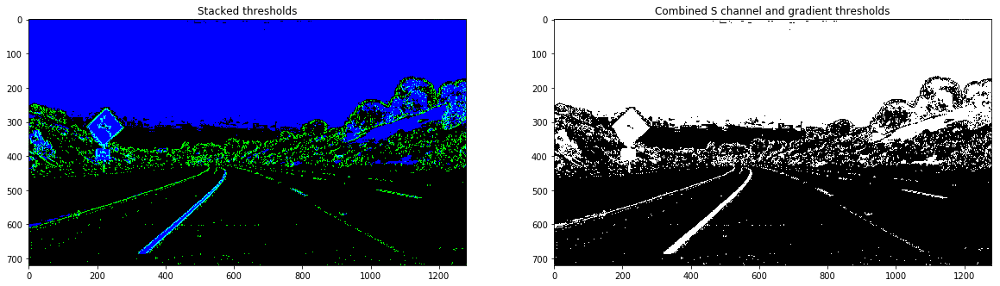

In [25]:
# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(color_binary)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(combined_binary, cmap='gray')

__Save images__

In [26]:
# Output images
cv2.imwrite("output_images/output_"+"Stacked thresholds.jpg",color_binary)
cv2.imwrite("output_images/output_"+"Combined S channel and gradient thresholds.jpg",combined_binary)

True

### 3. Describe how (and identify where in your code) you performed a perspective transform and provide an example of a transformed image.

Here I am going to demonstrate my perspective transform approach. There is a function called `Perspective_Transfer_Warper()`. It will take image(`img`), source points coordinate(`src_coordins`) and destination points coordinate(`dst_coordins`) as inputs. Then it will return a perspective transform image(`ret_Img`).

__Import Libraries__

In [27]:
# # All the following libraries were imported above
# # Uncommented the following lines if you just want to run this section

# import numpy as np
# import cv2
# import matplotlib.pyplot as plt
# import matplotlib.image as mpimg

# %matplotlib inline

__Define Functions__

In [28]:
def Perspective_Transfer_Warper(img, src_coordins, dst_coordins):
    # Compute and apply perpective transform
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src_coordins, dst_coordins)
    ret_Img = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)  # keep same size as input image
    return ret_Img

__Initialization__

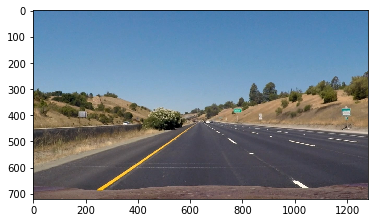

In [29]:
# Path to image
fname = './test_images/straight_lines1.jpg'
# Read in an image
img = cv2.imread(fname)
# Plot the original image
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [30]:
img_size = (img.shape[1], img.shape[0])
print(img_size)

# Define source points coordinate
src_coordins = np.float32(
    [[(img_size[0] / 2) - 60, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 15), img_size[1]],
    [(img_size[0] * 5 / 6) + 45, img_size[1]],
    [(img_size[0] / 2 + 60), img_size[1] / 2 + 100]])
# Define destination points coordinate
dst_coordins = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])

print(src_coordins)
print(dst_coordins)

(1280, 720)
[[  580.           460.        ]
 [  198.33332825   720.        ]
 [ 1111.66662598   720.        ]
 [  700.           460.        ]]
[[ 320.    0.]
 [ 320.  720.]
 [ 960.  720.]
 [ 960.    0.]]


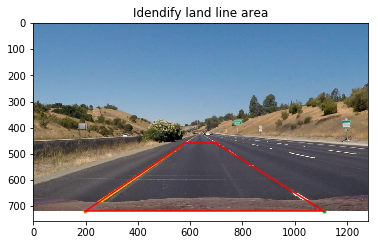

In [31]:
# Plot image
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Idendify land line area')

# Plot source points
plt.plot(src_coordins[0][0],src_coordins[0][1],'.')
plt.plot(src_coordins[1][0],src_coordins[1][1],'.')
plt.plot(src_coordins[2][0],src_coordins[2][1],'.')
plt.plot(src_coordins[3][0],src_coordins[3][1],'.')

# Draw lines between points
plt.plot([src_coordins[0][0], src_coordins[1][0]],[src_coordins[0][1], src_coordins[1][1]],'r-')
plt.plot([src_coordins[1][0], src_coordins[2][0]],[src_coordins[1][1], src_coordins[2][1]],'r-')
plt.plot([src_coordins[2][0], src_coordins[3][0]],[src_coordins[2][1], src_coordins[3][1]],'r-')
plt.plot([src_coordins[3][0], src_coordins[0][0]],[src_coordins[3][1], src_coordins[0][1]],'r-')

__Save images__

In [32]:
# Output images
cv2.imwrite("output_images/output_"+"Idendify land line area.jpg",cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

True

__Process Image__

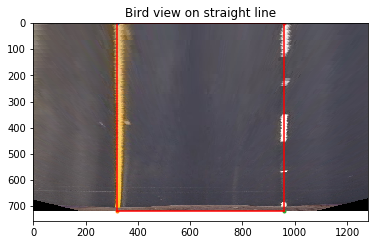

In [33]:
# Compute and applu perspective transform
Warper = Perspective_Transfer_Warper(img, src_coordins, dst_coordins)

# Plot image
plt.imshow(cv2.cvtColor(Warper,cv2.COLOR_BGR2RGB))
plt.title('Bird view on straight line')

# Plot source points
plt.plot(dst_coordins[0][0],dst_coordins[0][1],'.')
plt.plot(dst_coordins[1][0],dst_coordins[1][1],'.')
plt.plot(dst_coordins[2][0],dst_coordins[2][1],'.')
plt.plot(dst_coordins[3][0],dst_coordins[3][1],'.')

# Draw lines between points
plt.plot([dst_coordins[0][0], dst_coordins[1][0]],[dst_coordins[0][1], dst_coordins[1][1]],'r-')
plt.plot([dst_coordins[1][0], dst_coordins[2][0]],[dst_coordins[1][1], dst_coordins[2][1]],'r-')
plt.plot([dst_coordins[2][0], dst_coordins[3][0]],[dst_coordins[2][1], dst_coordins[3][1]],'r-')
plt.plot([dst_coordins[3][0], dst_coordins[0][0]],[dst_coordins[3][1], dst_coordins[0][1]],'r-')

__Save images__

In [34]:
# Output images
cv2.imwrite("output_images/output_"+"Bird view on straight line.jpg",cv2.cvtColor(Warper,cv2.COLOR_BGR2RGB))

True

__Test on curved lines__

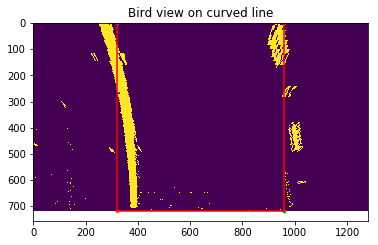

In [35]:
# Compute and apply perspective transform
Warper = Perspective_Transfer_Warper(combined_binary, src_coordins, dst_coordins)

# Plot image
plt.imshow(Warper)
plt.title('Bird view on curved line')

# Plot source points
plt.plot(dst_coordins[0][0],dst_coordins[0][1],'.')
plt.plot(dst_coordins[1][0],dst_coordins[1][1],'.')
plt.plot(dst_coordins[2][0],dst_coordins[2][1],'.')
plt.plot(dst_coordins[3][0],dst_coordins[3][1],'.')

# Draw lines between points
plt.plot([dst_coordins[0][0], dst_coordins[1][0]],[dst_coordins[0][1], dst_coordins[1][1]],'r-')
plt.plot([dst_coordins[1][0], dst_coordins[2][0]],[dst_coordins[1][1], dst_coordins[2][1]],'r-')
plt.plot([dst_coordins[2][0], dst_coordins[3][0]],[dst_coordins[2][1], dst_coordins[3][1]],'r-')
plt.plot([dst_coordins[3][0], dst_coordins[0][0]],[dst_coordins[3][1], dst_coordins[0][1]],'r-')

__Save images__

In [36]:
# Output images
cv2.imwrite("output_images/output_"+"Bird view on curved line.jpg",Warper)

True

### 4. Describe how (and identify where in your code) you identified lane-line pixels and fit their positions with a polynomial?

Here I am using the sliding window technique to identify the lane-line pixels. This implementation was done by two functions called `find_land_line_pixels()` and `fit_polynomial()`. In the end, you will find a plot with drawn polynomial land lines.

__Import Libraries__

In [37]:
# import numpy as np
# import cv2
# import matplotlib.pyplot as plt

__Plot Histogram__

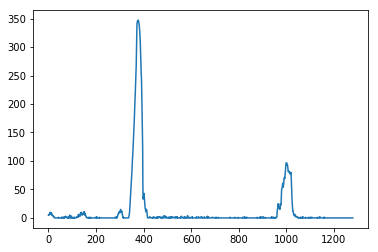

In [38]:
# Take a histogram of the bottom half of the image
histogram = np.sum(Warper[Warper.shape[0]//2:,:], axis=0)

# Plot image
plt.plot(histogram)

__Define Functions__

In [39]:
def find_land_line_pixels(out_img, binary_img, list_lane_line_pixel_coords, nwindows, x_base, margin, minpix):
    # Set height of windows
    window_height = np.int(binary_img.shape[0]/nwindows)
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_img.shape[0] - (window+1)*window_height
        win_y_high = binary_img.shape[0] - window*window_height
        win_xleft_low = x_base - margin
        win_xleft_high = x_base + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2)
        # Identify the nonzero pixels in x and y within the window
        good_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        # Append these indices to the lists
        list_lane_line_pixel_coords.append(good_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_inds) > minpix:
            x_base = np.int(np.mean(nonzerox[good_inds]))
    # Concatenate the arrays of indices
    list_lane_line_pixel_coords = np.concatenate(list_lane_line_pixel_coords)
    return list_lane_line_pixel_coords

def fit_polynomial(binary_img, list_lane_line_pixel_coords, poly_order=2):
    # Extract left and right line pixel positions
    x = nonzerox[list_lane_line_pixel_coords]
    y = nonzeroy[list_lane_line_pixel_coords]
    # Fit a second order polynomial to each
    ret_fit_polynomial = np.polyfit(y, x, poly_order)
    return ret_fit_polynomial

__Initialization__

In [40]:
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Create an output image to draw on and  visualize the result
out_img = np.dstack((Warper, Warper, Warper))*255

# Choose the number of sliding windows
nwindows = 20
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50

# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Identify the x and y positions of all nonzero pixels in the image
nonzero = Warper.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])

__Process image__

Implement Sliding Windows and Fit a Polynomial

In [41]:
# Find pixels coordinates in each land lines
list_x_left_coords = find_land_line_pixels(out_img, Warper, left_lane_inds, nwindows, leftx_base, margin, minpix)
list_x_right_coords = find_land_line_pixels(out_img, Warper, right_lane_inds, nwindows, rightx_base, margin, minpix)

In [42]:
# Fit a second order polynomial to each land lines
fit_poly_x_left = fit_polynomial(Warper, list_x_left_coords, poly_order=2)
fit_poly_x_right = fit_polynomial(Warper, list_x_right_coords, poly_order=2)

__Plot polynomial__

(720, 0)

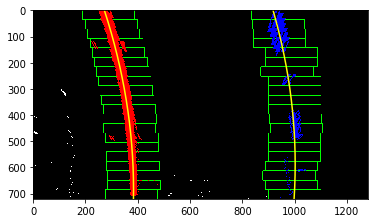

In [43]:
# Generate x and y values for plotting
ploty = np.linspace(0, Warper.shape[0]-1, Warper.shape[0] )
plotx_left = fit_poly_x_left[0]*ploty**2 + fit_poly_x_left[1]*ploty + fit_poly_x_left[2]
plotx_right = fit_poly_x_right[0]*ploty**2 + fit_poly_x_right[1]*ploty + fit_poly_x_right[2]

# Plot each polynomial lines on the output image
out_img[nonzeroy[list_x_left_coords], nonzerox[list_x_left_coords]] = [255, 0, 0]
out_img[nonzeroy[list_x_right_coords], nonzerox[list_x_right_coords]] = [0, 0, 255]

# Plot image
plt.imshow(out_img)
plt.plot(plotx_left, ploty, color='yellow')
plt.plot(plotx_right, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

__Save images__

In [44]:
# Output images
cv2.imwrite("output_images/output_"+"Fit with a polynomial.jpg",out_img)

True

### 5. Describe how (and identify where in your code) you calculated the radius of curvature of the lane and the position of the vehicle with respect to center.

In [45]:
# Define y-value where we want radius of curvature
# I'll choose the mean y-value, corresponding to the middle of the image
y_eval = np.mean(ploty)

# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(ploty*ym_per_pix, plotx_left*xm_per_pix, 2)
right_fit_cr = np.polyfit(ploty*ym_per_pix, plotx_right*xm_per_pix, 2)
# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')

# Caluculate the bottom points coodinate
bottom_y = np.max(ploty)
print('bottom_y is ', bottom_y)
bottom_x_left = fit_poly_x_left[0]*bottom_y**2 + fit_poly_x_left[1]*bottom_y + fit_poly_x_left[2]
bottom_x_right = fit_poly_x_right[0]*bottom_y**2 + fit_poly_x_right[1]*bottom_y + fit_poly_x_right[2]
print(bottom_x_left)
print(bottom_x_right)
# Caluculate the offset from the center of the lane
offset_center_pix = (bottom_x_left + bottom_x_right)/2 - img.shape[1]/2
offset_center_m = offset_center_pix*xm_per_pix
print('offset_center is ', offset_center_m, 'm')

693.617171328 m 672.989558464 m
bottom_y is  719.0
383.834811219
997.914156338
offset_center is  0.268907985686 m


### 6. Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly.

I will still using the test image above `'./test_images/test2.jpg'` for plotting back down onto the road. 

First, compute the inverse perspective transform from the previous source and destination points coordinates.

In [46]:
# Compute the inverse perspective transform
Minv = cv2.getPerspectiveTransform(dst_coordins, src_coordins)

Second, load the image here. (Please commented out this cell if you are running code in all cells)

In [47]:
# Path to image
fname = './test_images/test2.jpg'
# Read in an image
original_img = cv2.imread(fname)

In the end, plot the result back down onto the original image

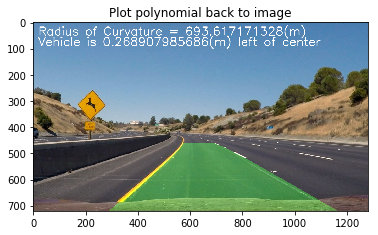

In [48]:
# Create an image to draw the lines on
warp_zero = np.zeros_like(Warper).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([plotx_left, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([plotx_right, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (original_img.shape[1], original_img.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(original_img, 1, newwarp, 0.3, 0)

# Convert to RGB color
result = cv2.cvtColor(result,cv2.COLOR_BGR2RGB)

# Add real-time analysis data to the image
font = cv2.FONT_HERSHEY_SIMPLEX
result = cv2.putText(result,'Radius of Curvature = %s(m)' % (left_curverad),(20,50), font, 1.5,(255,255,255),2,cv2.LINE_AA)
result = cv2.putText(result,'Vehicle is %s(m) left of center' % (offset_center_m),(20,90), font, 1.5,(255,255,255),2,cv2.LINE_AA)


# Plot image
plt.imshow(result)
plt.title('Plot polynomial back to image')
#plt.text(20, 120, 'Radius of Curvature = %s(m)\nVehicle is %s(m) left of center' % (left_curverad, offset_center_m), fontsize=12, color='white')

__Save images__

In [49]:
# Output images
cv2.imwrite("output_images/output_"+"Plot polynomial back to image.jpg",result)

True

## Pipeline (video)

Provide a link to your final video output. Your pipeline should perform reasonably well on the entire project video (wobbly lines are ok but no catastrophic failures that would cause the car to drive off the road!)

Using the code in project 1 to process the given video `project_video.mp4` and created a new video called `test_videos_output/project_video_output.mp4` with the rersult plotted back.

__Import Libraries__

In [50]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

import numpy as np
from helper_functions import process_image

__Process Video__

Test on the given video `project_video.mp4`

In [51]:
video_output = 'test_videos_output/project_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
# clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
video_output_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time video_output_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/project_video_output.mp4
[MoviePy] Writing video test_videos_output/project_video_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [02:50<00:00,  7.39it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video_output.mp4 

Wall time: 2min 51s


__Play Video Inline__

In [52]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))

## Discussion
Briefly discuss any problems / issues you faced in your implementation of this project. Where will your pipeline likely fail? What could you do to make it more robust?

While there is a brighter road surface, my implementation will return a random land line prediction. I would like to implement all the tips and tricks from the page [Tips and Tricks for the Project](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/40ec78ee-fb7c-4b53-94a8-028c5c60b858/concepts/7ee45090-7366-424b-885b-e5d38210958f) to make my code more robust on different road surface.

* Step 1 
Create a class of line for `tracking` purpose.
* Step 2
Compare those line characteristic and the new calculated data with `Sanity Check`.
* Step 3
Depends on the result from Step 2, either dropping the new calculated data or taking it into the line characteristic.
* Step 4
Applying `Look-Ahead Filter` and `Smoothing` to the line characteristic and the new processed image.
* Step 5
In Step 3, if it is keep droping the new calculated data for more than 10 times. Recalculate the line from scratch, meaning not using `Look-Ahead Filter` and `Smoothing`.